In [1]:
ls -ltrh ../Data/ice

total 39288
-rw-rw-rw-  1 bogdan  staff   2.2M Oct 24 11:58 N_seaice_extent_daily_v3.0.csv
-rw-rw-rw-  1 bogdan  staff   2.2M Oct 24 12:03 S_seaice_extent_daily_v3.0.csv
-rw-rw-rw-@ 1 bogdan  staff   3.2M Oct 24 12:05 Sea_Ice_Index_Regional_Daily_Data_G02135_v3.0.xlsx
-rw-r--r--@ 1 bogdan  staff   4.6M Nov 29 19:28 ice_final.csv
-rw-r--r--  1 bogdan  staff   6.0M Jan 15 19:55 ice_and_co2.csv


In [2]:
ls -ltrh ../Data/co2

total 432
-rw-r--r--@ 1 bogdan  staff    48K Nov 11 21:44 monthly_in_situ_co2.csv
-rw-r--r--@ 1 bogdan  staff    29K Nov 21 18:58 co2_mm_mlo.csv
-rw-r--r--@ 1 bogdan  staff    27K Nov 23 20:18 CO2_final.csv
-rw-r--r--@ 1 bogdan  staff    71K Nov 27 18:35 CO2_0000-2014.csv
-rw-r--r--@ 1 bogdan  staff    27K Dec  1 14:44 CO2_final_November.csv
-rw-r--r--@ 1 bogdan  staff   634B Dec 30 00:49 CO2_diff.csv


In [3]:
ls -ltrh ../Data/fire/*.csv

-rw-r--r--@ 1 bogdan  staff    50M Nov 24 12:56 ../Data/fire/fire_M6_final.csv
-rw-r--r--@ 1 bogdan  staff    85M Nov 24 13:03 ../Data/fire/fire_V1_final.csv


In [4]:
import numpy as np
import scipy as sp
import pandas as pd
from datetime import datetime as dt
import time
import random
import sklearn.model_selection
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.cluster import KMeans
from scipy.stats import norm, poisson, t
from statsmodels.formula.api import ols
import statsmodels.api as sm
from functools import reduce
import operator
from math import sin, cos, sqrt, atan2, radians
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib.colors import ListedColormap
import seaborn as sns
import plotly.graph_objects as go
%matplotlib inline

In [5]:
# Load fire data
fire_M6 = pd.read_csv('../Data/fire/fire_M6_final.csv', index_col = False)
fire_V1 = pd.read_csv('../Data/fire/fire_V1_final.csv', index_col = False)

In [6]:
fire_M6.head(3)

,acq_date,frp,latitude,longitude,decimal_time,mean_brightness,low_confidence,medium_confidence,high_confidence
0,2000-11-01,26.8,-20.8650,146.3039,0.01181,317.00,True,False,False
1,2000-11-01,68.8,-20.5602,146.0194,0.01181,319.95,False,True,False
2,2000-11-01,7.1,-24.3197,151.5619,0.01250,311.15,False,True,False


In [7]:
fire_V1.head(3)

,acq_date,frp,latitude,longitude,decimal_time,mean_brightness,low_confidence,medium_confidence,high_confidence
0,2012-01-31,0.9,11.81456,4.97983,0.05208,298.45,False,True,False
1,2012-01-31,1.3,10.39675,13.45527,0.05208,302.25,False,True,False
2,2012-01-31,1.9,13.73985,13.83765,0.05208,301.80,False,True,False


In [8]:
# Load CO2 data
CO2=pd.read_csv('../Data/co2/CO2_final.csv', index_col = False)
CO2.head(3)

,Year,Month,decimal_date,CO2_ppm,trend
0,1958,3,1958.208,315.71,314.62
1,1958,4,1958.292,317.45,315.29
2,1958,5,1958.375,317.50,314.71


In [9]:
CO2_diff = pd.read_csv('../Data/co2/CO2_diff.csv', index_col = False)
CO2_diff.columns = ['Year', 'CO2_difference']
CO2_diff.head(3)

,Year,CO2_difference
0,1958,4.84
1,1959,5.03
2,1960,6.20


In [10]:
# Load ice data
ice = pd.read_csv('../Data/ice/ice_final.csv', index_col = False)
ice = ice.set_index('Unnamed: 0')
ice.index.name = None
# use shorter names
ice.columns = ['Baffin', 'Baffin-ext', 'Barents-ext', 'Beaufort', 'Barents', 'Beaufort-ext',
'Bering', 'Bering-ext', 'Canadian', 'Canadian-ext', 'Central-Arctic', 'Central-Arctic-ext',
'Chukchi', 'Chukchi-ext', 'East-Siberian', 'East-Siberian-ext', 'Greenland', 'Greenland-ext',
'Hudson', 'Hudson-ext', 'Kara', 'Kara-ext', 'Laptev', 'Laptev-ext', 'Okhotsk', 'Okhotsk-ext',
'St-Lawrence', 'St-Lawrence-ext', 'North_ext', 'South_ext']
ice.head(3)

,Baffin,Baffin-ext,Barents-ext,Beaufort,Barents,Beaufort-ext,Bering,Bering-ext,Canadian,Canadian-ext,...,Kara,Kara-ext,Laptev,Laptev-ext,Okhotsk,Okhotsk-ext,St-Lawrence,St-Lawrence-ext,North_ext,South_ext
1978-10-28,416908.720,521862.289,222781.361,361743.416,895310.805,940219.39,11472.805,35555.883,719220.320,761228.252,...,569610.622,815398.750,802884.363,872414.226,16799.581,35135.582,0.0,0.0,10.4200,17.8030
1978-10-29,416908.720,521862.289,222781.361,361743.416,895310.805,940219.39,11472.805,35555.883,719220.320,761228.252,...,569610.622,815398.750,802884.363,872414.226,16799.581,35135.582,0.0,0.0,10.4885,17.7365
1978-10-30,419829.102,531533.703,229769.256,379395.172,894088.098,940219.39,13553.099,42670.305,717303.629,761228.252,...,562328.391,816017.367,806760.991,872414.226,18745.308,39102.698,0.0,0.0,10.5570,17.6700


In [278]:
"""
Inputs:  date, string format: YYYY-MM-DD
Outputs: date, float format
"""
def toYearFraction(date, decimals=True):
    date = dt.strptime(date, '%Y-%m-%d')
    def sinceEpoch(date): # returns seconds since epoch
        return time.mktime(date.timetuple())
    s = sinceEpoch

    year = date.year
    startOfThisYear = dt(year=year, month=1, day=1)
    startOfNextYear = dt(year=year+1, month=1, day=1)

    yearElapsed = s(date) - s(startOfThisYear)
    yearDuration = s(startOfNextYear) - s(startOfThisYear)
    fraction = yearElapsed/yearDuration

    if decimals:
        # return decimal year
        return date.year + fraction
    else:
        # return just the year
        return date.year

In [12]:
# Load ice and CO2 data
ice_and_co2 = pd.read_csv('../Data/ice/ice_and_co2.csv')
ice_and_co2.set_index(ice_and_co2.columns[0], inplace=True)
ice_and_co2.index.name = None
ice_and_co2_original = ice_and_co2.copy()

# Add a decimal date for ice_and_co2 dataframe, for regression purposes
ice_and_co2['decimal_date'] = list(map(lambda x: toYearFraction(x), list(ice_and_co2.index)))

In [13]:
ice_and_co2.head(3)

,North_ext,Chukchi,Chukchi-ext,Kara,Kara-ext,Baffin,Baffin-ext,Canadian,Canadian-ext,Hudson,...,Okhotsk-ext,St-Lawrence,St-Lawrence-ext,Central-Arctic,Central-Arctic-ext,South_ext,North_and_South,CO2_ppm,trend,decimal_date
1978-10-28,10.4200,512197.242,612396.111,569610.622,815398.750,416908.720,521862.289,719220.320,761228.252,246180.927,...,35135.582,0.0,0.0,1862320.419,3224681.689,17.8030,28.223,332.971935,335.81,1978.821918
1978-10-29,10.4885,512197.242,612396.111,569610.622,815398.750,416908.720,521862.289,719220.320,761228.252,246180.927,...,35135.582,0.0,0.0,1862320.419,3224681.689,17.7365,28.225,333.015161,335.82,1978.824658
1978-10-30,10.5570,520961.376,624383.567,562328.391,816017.367,419829.102,531533.703,717303.629,761228.252,261666.759,...,39102.698,0.0,0.0,1859850.012,3224681.689,17.6700,28.227,333.058387,335.83,1978.827397


In [14]:
ice_and_co2.columns

Index(['North_ext', 'Chukchi', 'Chukchi-ext', 'Kara', 'Kara-ext', 'Baffin',
       'Baffin-ext', 'Canadian', 'Canadian-ext', 'Hudson', 'Hudson-ext',
       'Greenland', 'Greenland-ext', 'Laptev', 'Laptev-ext', 'Barents',
       'Barents-ext', 'East-Siberian', 'East-Siberian-ext', 'Beaufort',
       'Beaufort-ext', 'Bering', 'Bering-ext', 'Okhotsk', 'Okhotsk-ext',
       'St-Lawrence', 'St-Lawrence-ext', 'Central-Arctic',
       'Central-Arctic-ext', 'South_ext', 'North_and_South', 'CO2_ppm',
       'trend', 'decimal_date'],
      dtype='object')

# Ice and CO2 datasets

The latest 20 years show an acceleration of the historical trend for CO2 as shown below

In [15]:
sns.set_style("whitegrid")
sns.set_context("poster")

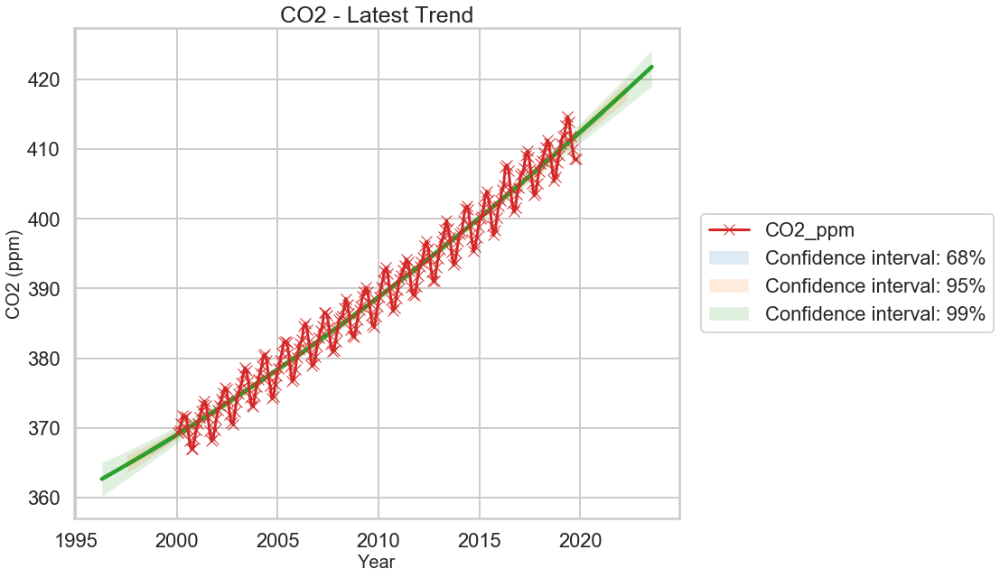

In [16]:
sd = {"sd1": 68.27, "sd2": 95.45, "sd3": 99.73}
detail_df=CO2[502:]
fig = plt.figure(figsize=(12, 10))
for sd_item in sd.keys():
    ax = sns.regplot(x='decimal_date', y='CO2_ppm', ci=sd[sd_item], data=detail_df, order=2, scatter_kws={'s':5})
plt.plot('decimal_date', 'CO2_ppm', data=detail_df, linestyle='-', marker='x')
plt.title('CO2 - Latest Trend', fontsize=25); plt.xlabel('Year', fontsize=20); plt.ylabel('CO2 (ppm)', fontsize=20)
ax.collections[1].set_label('Confidence interval: 68%')
ax.collections[3].set_label('Confidence interval: 95%')
ax.collections[5].set_label('Confidence interval: 99%')
ax.legend(loc='center left', bbox_to_anchor=(1.02, 0.5), ncol=1)
plt.show()

In [17]:
ice_and_co2.head(3)

,North_ext,Chukchi,Chukchi-ext,Kara,Kara-ext,Baffin,Baffin-ext,Canadian,Canadian-ext,Hudson,...,Okhotsk-ext,St-Lawrence,St-Lawrence-ext,Central-Arctic,Central-Arctic-ext,South_ext,North_and_South,CO2_ppm,trend,decimal_date
1978-10-28,10.4200,512197.242,612396.111,569610.622,815398.750,416908.720,521862.289,719220.320,761228.252,246180.927,...,35135.582,0.0,0.0,1862320.419,3224681.689,17.8030,28.223,332.971935,335.81,1978.821918
1978-10-29,10.4885,512197.242,612396.111,569610.622,815398.750,416908.720,521862.289,719220.320,761228.252,246180.927,...,35135.582,0.0,0.0,1862320.419,3224681.689,17.7365,28.225,333.015161,335.82,1978.824658
1978-10-30,10.5570,520961.376,624383.567,562328.391,816017.367,419829.102,531533.703,717303.629,761228.252,261666.759,...,39102.698,0.0,0.0,1859850.012,3224681.689,17.6700,28.227,333.058387,335.83,1978.827397


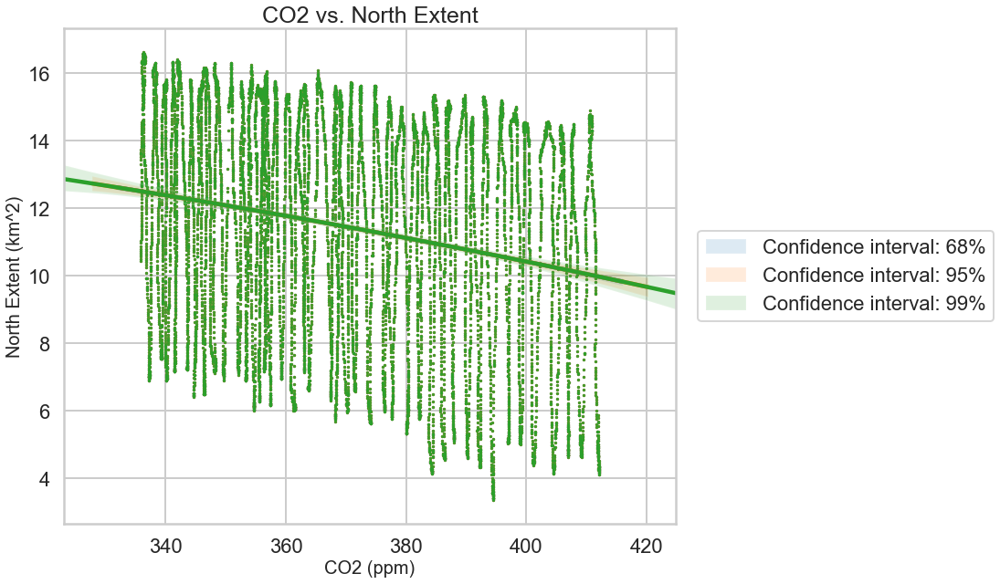

In [18]:
sd = {"sd1": 68.27, "sd2": 95.45, "sd3": 99.73}
detail_df=ice_and_co2[['North_ext', 'trend']]
fig = plt.figure(figsize=(12, 10))
for sd_item in sd.keys():
    ax = sns.regplot(x='trend', y='North_ext', ci=sd[sd_item], data=detail_df, order=2, scatter_kws={'s':5})
#plt.plot('decimal_date', 'CO2_ppm', data=detail_df, linestyle='-', marker='x')
plt.title('CO2 vs. North Extent', fontsize=25)
plt.xlabel('CO2 (ppm)', fontsize=20)
plt.ylabel('North Extent (km^2)', fontsize=20)
ax.collections[1].set_label('Confidence interval: 68%')
ax.collections[3].set_label('Confidence interval: 95%')
ax.collections[5].set_label('Confidence interval: 99%')
ax.legend(loc='center left', bbox_to_anchor=(1.02, 0.5), ncol=1)
plt.show()

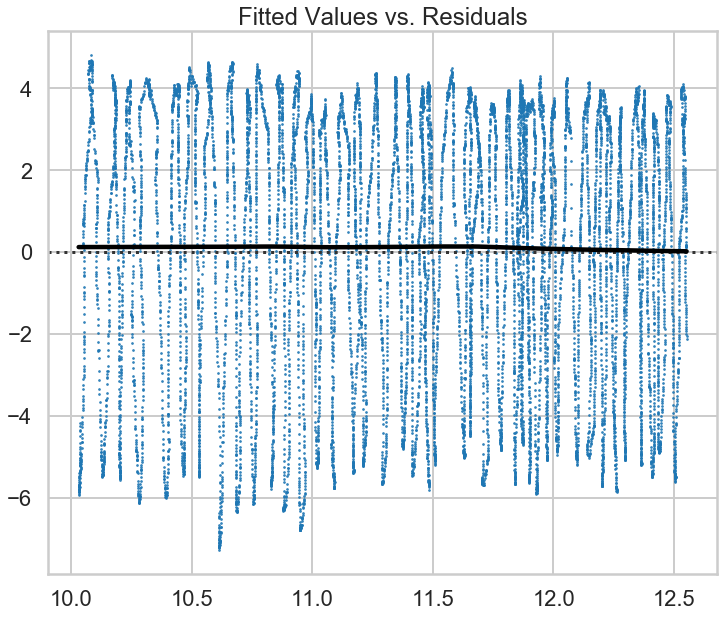

In [19]:
CO2_North_lm = ols('North_ext ~ trend', ice_and_co2).fit()

plt.figure(figsize=(12, 10))
plt.xlabel("Fitted Values")
plt.ylabel("Residual")
plt.title("Fitted Values vs. Residuals")
sns.residplot(CO2_North_lm.fittedvalues, CO2_North_lm.resid, lowess=True, 
              scatter_kws={"s": 3},
              line_kws={'color': 'black'})
plt.show()

There is no obvious trend, therefore the order 1 linear correlation 'North_ext ~ trend' provides a very good fit.

Ice_and_CO2 - check in ice data for an anomaly similar with the one from CO2 data (between 1990...1995)

Order2:
coef2= -0.0006918904930265838, coef1= 2.707104303632408, intercept= -2635.1690075379142



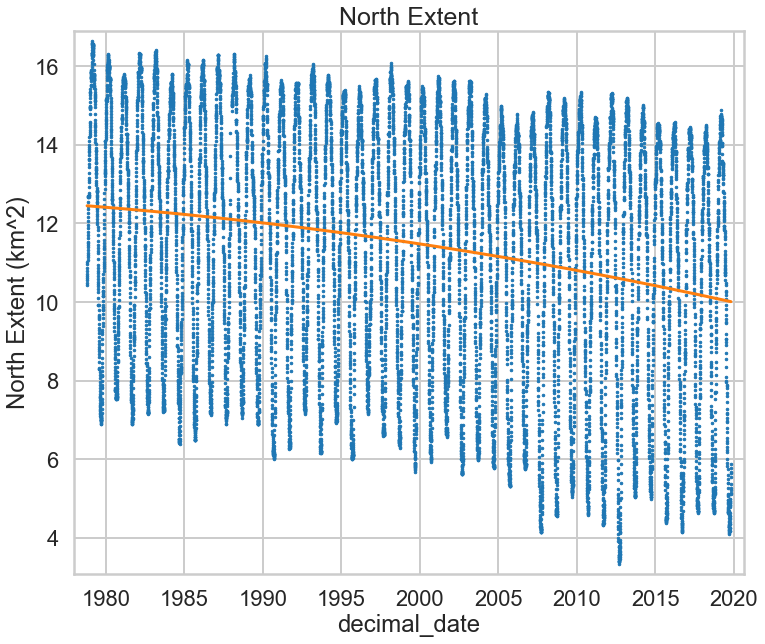

In [20]:
# North Extent

coef2_2, coef1_2, intercept_2 = np.polyfit(x=ice_and_co2['decimal_date'], y=ice_and_co2['North_ext'], deg=2)
print("Order2:\ncoef2= {}, coef1= {}, intercept= {}\n".format(coef2_2, coef1_2, intercept_2))

fig = plt.figure(figsize=(12, 10))
plt.plot(ice_and_co2['decimal_date'], ice_and_co2['North_ext'], marker='.', linestyle='none', ms=5)
plt.margins(0.02)
plt.xlabel('decimal_date')
plt.ylabel('North Extent (km^2)')

x = np.array(ice_and_co2['decimal_date'])
y = np.array(coef2_2 * x**2 + coef1_2 * x + intercept_2)
plt.plot(x,y)
plt.title('North Extent', fontsize=25)
plt.show()

Order2:
coef2= -89.32052046296351, coef1= 352382.6289382967, intercept= -346820162.5238219



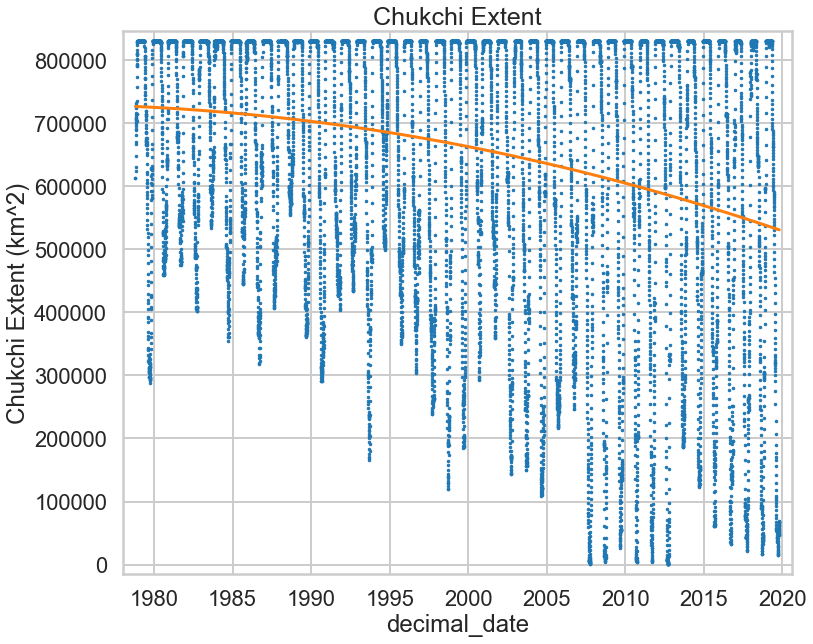

In [21]:
coef2_2, coef1_2, intercept_2 = np.polyfit(x=ice_and_co2['decimal_date'], y=ice_and_co2['Chukchi-ext'], deg=2)
print("Order2:\ncoef2= {}, coef1= {}, intercept= {}\n".format(coef2_2, coef1_2, intercept_2))

fig = plt.figure(figsize=(12, 10))
plt.plot(ice_and_co2['decimal_date'], ice_and_co2['Chukchi-ext'], marker='.', linestyle='none', ms=5)
plt.margins(0.02)
plt.xlabel('decimal_date')
plt.ylabel('Chukchi Extent (km^2)')

x = np.array(ice_and_co2['decimal_date'])
y = np.array(coef2_2 * x**2 + coef1_2 * x + intercept_2)
plt.plot(x,y)
plt.title('Chukchi Extent', fontsize=25)
plt.show()

Order2:
coef2= -2565.0550989781477, coef1= 10305014.091246199, intercept= -10349249728.46145



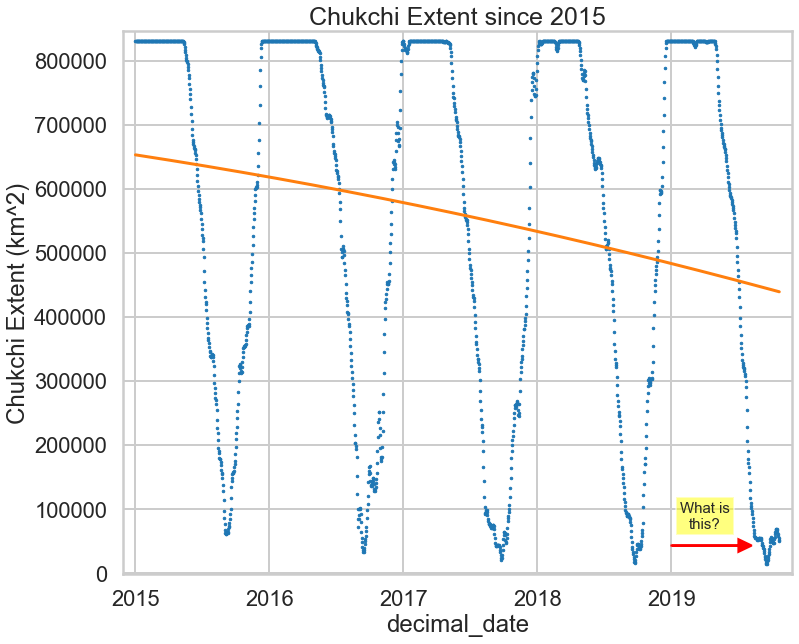

In [22]:
ice_2015 = ice_and_co2[ice_and_co2['decimal_date'] >= 2015]
coef2_2, coef1_2, intercept_2 = np.polyfit(x=ice_2015['decimal_date'], y=ice_2015['Chukchi-ext'], deg=2)
print("Order2:\ncoef2= {}, coef1= {}, intercept= {}\n".format(coef2_2, coef1_2, intercept_2))

fig = plt.figure(figsize=(12, 10))
plt.plot(ice_2015['decimal_date'], ice_2015['Chukchi-ext'], marker='.', linestyle='none', ms=5)
plt.margins(0.02)
plt.xlabel('decimal_date')
plt.ylabel('Chukchi Extent (km^2)')

x = np.array(ice_2015['decimal_date'])
y = np.array(coef2_2 * x**2 + coef1_2 * x + intercept_2)
plt.plot(x,y)
plt.text(2019.25, 70000, 'What is\nthis?', horizontalalignment='center', fontsize=15,
        bbox=dict(facecolor='yellow', alpha=0.5))
plt.arrow(2019, 43000, 0.5, 0, length_includes_head=False, color='red', head_width=20000, head_length=0.1)
plt.title('Chukchi Extent since 2015', fontsize=25)
plt.show()

Zooming in from 2015 to present for Chucki ice extent shows a very strange pattern change for the end of 2019. Generally, the ice extent covers the whole sea during the winter for about 5 months and goes close to zero for a brief period of time during the summer. However, during the summer of 2019 the ice extent stayed close to zero for 2 months. This has never happened before according to satellite data. The data is real, there are no errors.

The 2019 Chukchi ice extent anomaly is outside the scope of this analyze. The purpose of this analyze is to check if the 1990...1995 CO2 anomaly can be found for ice data as well.

In [23]:
ice_and_co2['period']=np.NaN
ice_and_co2.loc[ice_and_co2['decimal_date']<=1990, 'period']='before 1990'
ice_and_co2.loc[(ice_and_co2['decimal_date']>1990) & (ice_and_co2['decimal_date']<=1995), 'period']='1990...1995'
ice_and_co2.loc[ice_and_co2['decimal_date']>1995, 'period']='after 1995'

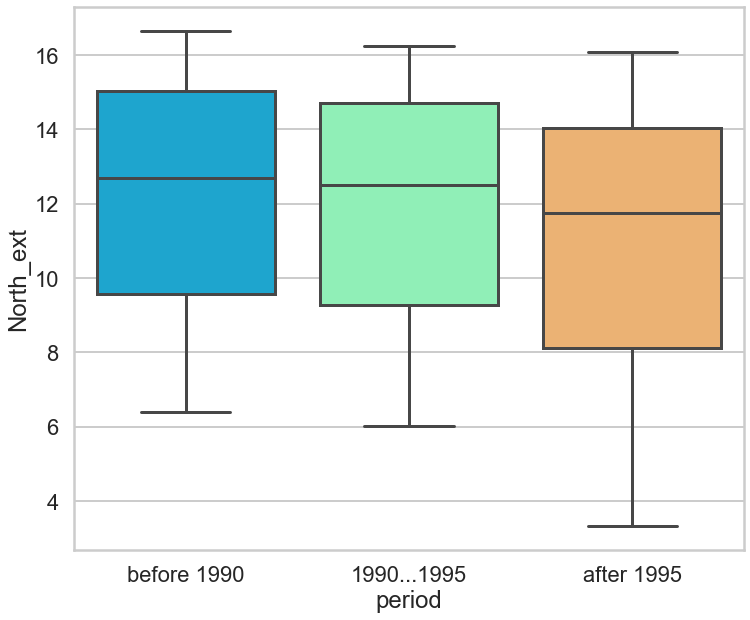

In [24]:
plt.figure(figsize=(12, 10))
sns.boxplot(data=ice_and_co2, x='period', y='North_ext', palette='rainbow')

The 1990...1995 is present in ice data but it is not as obvious as for CO2 data

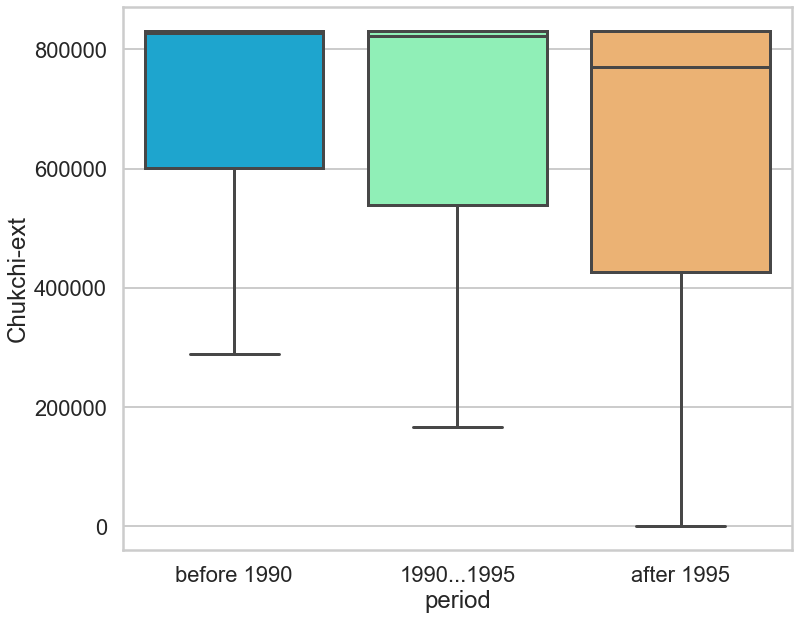

In [25]:
plt.figure(figsize=(12, 10))
sns.boxplot(data=ice_and_co2, x='period', y='Chukchi-ext', palette='rainbow')

The boxplots for the 3 periods of time are different. After 1995 the first quartile is much lower than before for North extent and Chukchi extent. For Chukchi extent, until 1995 the median was very close to the max sea extent. This means that ice was completely covering the sea for about half of the time. Starting from 1995 this situation changed, the median is lower.

Order2, until 1990:
coef2= 0.002452317694849234, coef1= -9.820797433169488, intercept= 9843.697752063694



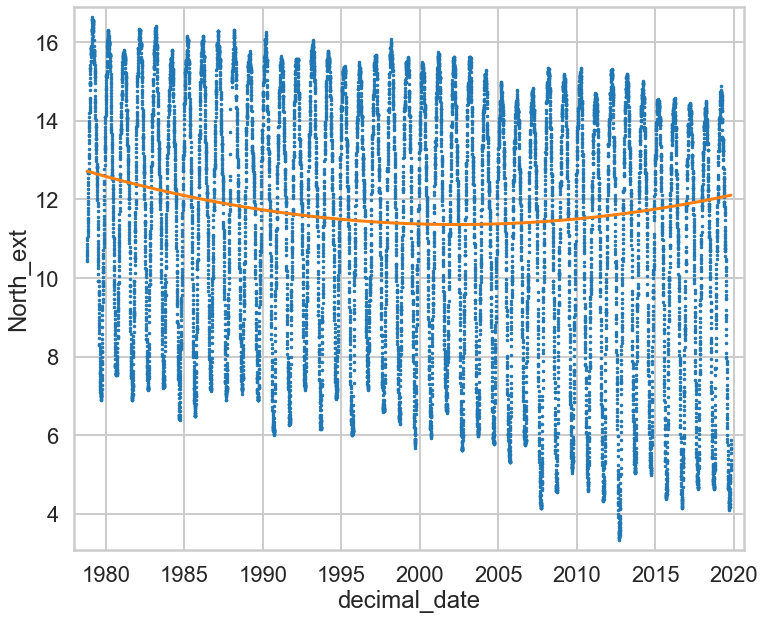

In [26]:
ice_and_co2_until_1990 = ice_and_co2[ice_and_co2['decimal_date'] <= 1990]
coef2_1990, coef1_1990, intercept_1990 = np.polyfit(x=ice_and_co2_until_1990['decimal_date'], 
                                                    y=ice_and_co2_until_1990['North_ext'], 
                                                    deg=2)
print("Order2, until 1990:\ncoef2= {}, coef1= {}, intercept= {}\n".format(coef2_1990, coef1_1990, intercept_1990))

fig = plt.figure(figsize=(12, 10))
plt.plot(ice_and_co2['decimal_date'], ice_and_co2['North_ext'], marker='.', linestyle='none', ms=5)
plt.margins(0.02)
plt.xlabel('decimal_date')
plt.ylabel('North_ext')

x = np.array(ice_and_co2['decimal_date'])
y = np.array(coef2_1990 * x**2 + coef1_1990 * x + intercept_1990)
plt.plot(x,y)
plt.show()

By using only the ice data until 1990, the order 2 coefficient was positive. This is inconsistent with the overall trend for ice data shown above. The trend after 1990 (and 1995) does not fit well with the model fitted only with data before 1990.

Order2, until 1990:
coef2= 0.00040465617522436197, coef1= -1.703007631145036, intercept= 1798.9580686587433



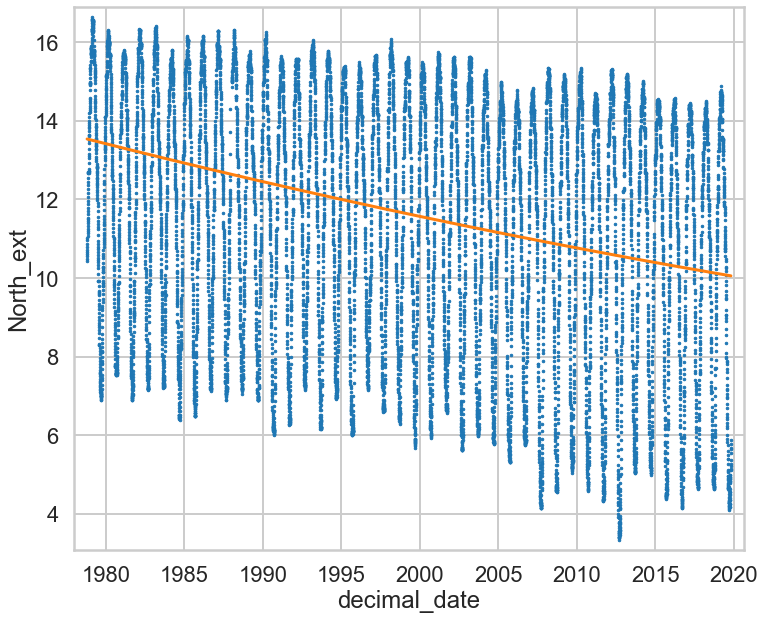

In [27]:
ice_and_co2_after_1995 = ice_and_co2[ice_and_co2['decimal_date'] > 1995]
coef2_1995, coef1_1995, intercept_1995 = np.polyfit(x=ice_and_co2_after_1995['decimal_date'], 
                                                    y=ice_and_co2_after_1995['North_ext'], 
                                                    deg=2)
print("Order2, until 1990:\ncoef2= {}, coef1= {}, intercept= {}\n".format(coef2_1995, coef1_1995, intercept_1995))

fig = plt.figure(figsize=(12, 10))
plt.plot(ice_and_co2['decimal_date'], ice_and_co2['North_ext'], marker='.', linestyle='none', ms=5)
plt.margins(0.02)
plt.xlabel('decimal_date')
plt.ylabel('North_ext')

x = np.array(ice_and_co2['decimal_date'])
y = np.array(coef2_1995 * x**2 + coef1_1995 * x + intercept_1995)
plt.plot(x,y)
plt.show()

In conclusion, by analyzing the ice extent and the CO2 level, the order 1 linear correlation
overall results in a good 'fitted vs. residuals'.

By using the ice data after 1995, the order 2 coefficient is still positive but very small.
The data seams to be better interpolated in this case.

Text(0.5, 1, '\nHeatmap: Ice and CO2\n')

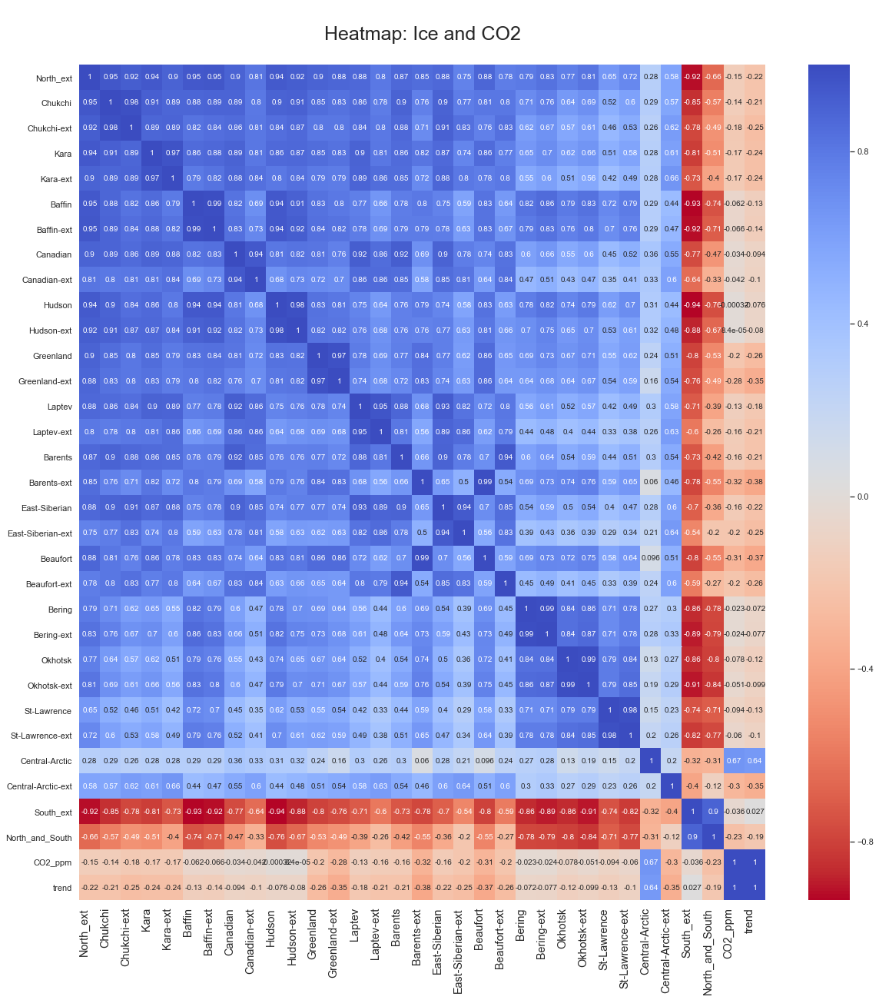

In [28]:
sns.set(font_scale=1.)
plt.figure(figsize=(20,20))
plt.xticks(
    rotation=45, 
    horizontalalignment='right',
    fontweight='light',
    fontsize='large'  
)
ax = sns.heatmap(ice_and_co2_original.corr(),cmap='coolwarm_r',annot=True,annot_kws={"size": 10})
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)
plt.title('\nHeatmap: Ice and CO2\n', fontsize=25)

Since there is such a strong correlation between Northern seas and sea extents, there is no need for a detailed analize for each individual sea for proving the overall correlation between CO2 increase and sea ice decrease.

# Fire datasets: fire_M6 and fire_V1

The fire datasets are special. They provide data every few days from the same locations because the Earth observing satelites are parked in polar orbits. However, there may be missing data, not only due to errors or maintainance time of the instruments but because of the cloud cover as well. Therefore, the data must be integrated over longer periods of time and wider geographical regions in order to level out all these potential issues.

There are two datasets with the same structure, from different satellites. The first one starts in 2000 and the second one starts in 2012. The second dataset has a higher resolution.

In [29]:
fire_M6.head(3)

,acq_date,frp,latitude,longitude,decimal_time,mean_brightness,low_confidence,medium_confidence,high_confidence
0,2000-11-01,26.8,-20.8650,146.3039,0.01181,317.00,True,False,False
1,2000-11-01,68.8,-20.5602,146.0194,0.01181,319.95,False,True,False
2,2000-11-01,7.1,-24.3197,151.5619,0.01250,311.15,False,True,False


In [30]:
fire_V1.head(3)

,acq_date,frp,latitude,longitude,decimal_time,mean_brightness,low_confidence,medium_confidence,high_confidence
0,2012-01-31,0.9,11.81456,4.97983,0.05208,298.45,False,True,False
1,2012-01-31,1.3,10.39675,13.45527,0.05208,302.25,False,True,False
2,2012-01-31,1.9,13.73985,13.83765,0.05208,301.80,False,True,False


In [31]:
X_M6 = fire_M6[['latitude', 'longitude']]
X_V1 = fire_V1[['latitude', 'longitude']]

In [32]:
X_M6

,latitude,longitude
0,-20.8650,146.3039
1,-20.5602,146.0194
2,-24.3197,151.5619
3,-18.0912,128.9856
4,-25.5102,125.4199
...,...,...
817395,-12.7448,34.9001
817396,-9.7875,37.0789
817397,38.4152,-105.9837
817398,54.1094,-128.2815


In [33]:
X_V1

,latitude,longitude
0,11.81456,4.97983
1,10.39675,13.45527
2,13.73985,13.83765
3,10.61242,13.48132
4,9.41623,-2.80546
...,...,...
1353790,67.30786,145.38925
1353791,67.72408,143.42404
1353792,65.36288,142.79898
1353793,45.53228,29.51213


In [34]:
# Use KMeans clustering for identifying clusters for the two datasets.
# For the beginning use 2 clusters and 100 iterations
n_iterations =100
kmeans_100_lat = []
kmeans_100_long = []
for i in range(n_iterations):
    kmeans = KMeans(n_clusters=2).fit(X_M6)
    centroids = kmeans.cluster_centers_
    kmeans_100_lat.append(list(centroids[:,0]))
    kmeans_100_long.append(list(centroids[:,1]))

In [35]:
# Show the 2 cluster centers on the map (foar all the 100 iterations, initialized randomly)
lat_list = reduce(operator.concat, kmeans_100_lat)
lon_list = reduce(operator.concat, kmeans_100_long)
# magnitudes are used here just for showing the positions of the centroids
mag_list = [5]*n_iterations
fig = go.Figure(go.Densitymapbox(lat=lat_list, lon=lon_list, z=mag_list, radius=5))
fig.update_layout(mapbox_style="stamen-terrain", mapbox_center_lon=180)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

There are only 2 centroids for k=2, as shown above. Since the centroids vary only by a tiny fraction, one random KMeans initialisation should end up with good clustering. However, I will check what happens with 50 clusters, 10 iterations.

In [36]:
# Plot 10% of M6 fire data on the map
fire_M6_small = fire_M6[::10]
fig = go.Figure(go.Densitymapbox(lat=fire_M6_small.latitude, 
                                 lon=fire_M6_small.longitude, 
                                 z=fire_M6_small.frp, 
                                 radius=4))
fig.update_layout(mapbox_style="stamen-terrain", mapbox_center_lon=180)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [72]:
sorted_lat_list = lat_list.sort()
sorted_lon_list = lon_list.sort()
print(np.std(lat_list[:100]), np.std(lat_list[100:]), np.std(lon_list[:100]), np.std(lon_list[100:]))

0.006935570907241524 0.01279210979705571 0.007574723479553655 0.030901830309921562


The centroids are almost in the same position for k=2, regardless of KMeans initialisation.

The standard deviation for the output of the 100 iterations is very small

In [73]:
# Check KMeans with 50 clusters, 10 iterations
n_iterations =10
kmeans_10_lat = []
kmeans_10_long = []
for i in range(n_iterations):
    kmeans = KMeans(n_clusters=50).fit(X_M6)
    centroids = kmeans.cluster_centers_
    kmeans_10_lat.append(list(centroids[:,0]))
    kmeans_10_long.append(list(centroids[:,1]))

In [74]:
n_clusters = 50
lat_list = reduce(operator.concat, kmeans_10_lat)
lon_list = reduce(operator.concat, kmeans_10_long)
mag_list = [10]*n_iterations*n_clusters
fig = go.Figure(go.Densitymapbox(lat=lat_list, lon=lon_list, z=mag_list, radius=10))
fig.update_layout(mapbox_style="stamen-terrain", mapbox_center_lon=180)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

Find the "best" number of clusters

In [75]:
# calculate inertia for number of clusters between 2 and 50
inertia = []
for i in range(2, 50):
    kmeans = KMeans(n_clusters=i, random_state=0).fit(X_M6)
    inertia.append(kmeans.inertia_)
    print("k = ", i, " inertia_ = ", kmeans.inertia_)

k =  2  inertia_ =  1759826829.0425248
k =  3  inertia_ =  699168446.7475693
k =  4  inertia_ =  537710834.5103371
k =  5  inertia_ =  383635774.4162456
k =  6  inertia_ =  290387332.2113521
k =  7  inertia_ =  220294829.45843583
k =  8  inertia_ =  178077348.2380452
k =  9  inertia_ =  150870487.13662943
k =  10  inertia_ =  131924646.8717421
k =  11  inertia_ =  120729046.64925666
k =  12  inertia_ =  102159311.91612564
k =  13  inertia_ =  93434960.4658642
k =  14  inertia_ =  86166412.84410803
k =  15  inertia_ =  80464815.13951212
k =  16  inertia_ =  75287381.48523133
k =  17  inertia_ =  71690870.81660561
k =  18  inertia_ =  65370881.42608894
k =  19  inertia_ =  61706012.41487291
k =  20  inertia_ =  60522140.4670592
k =  21  inertia_ =  55786202.01066352
k =  22  inertia_ =  51973262.34762642
k =  23  inertia_ =  48751969.84837793
k =  24  inertia_ =  46609570.4727111
k =  25  inertia_ =  44003610.59058599
k =  26  inertia_ =  42344191.15155685
k =  27  inertia_ =  40665536.2

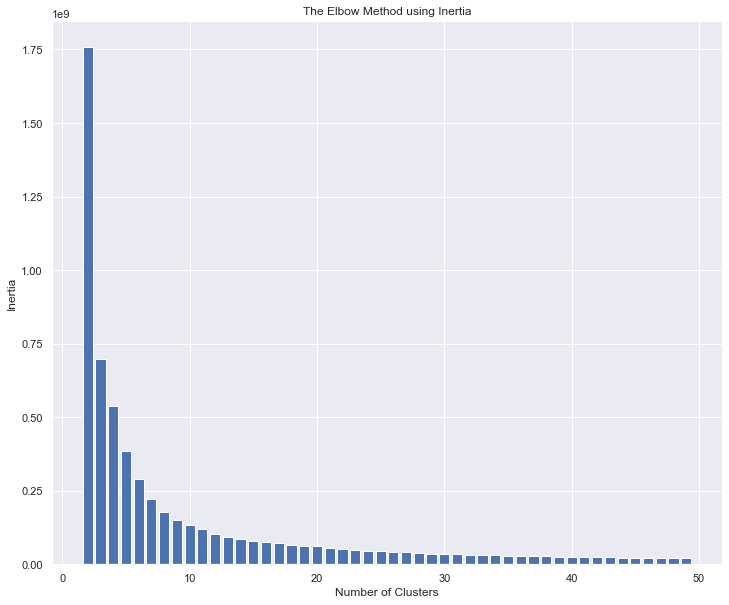

In [76]:
fig = plt.figure(figsize=(12, 10))
k = range(2, 50)
plt.bar(k, inertia)
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('The Elbow Method using Inertia')
plt.show()

It is difficult to chose a good value for k because there is no "elbow" in the diagram above. The reason is that the fires are scattered all around the globe excepting the Arctic and Antarctic regions. Possible solutions would be to chose median instead of mean as the kmeans metric and discarding the fires that are far away from any determined centroids and are not often in the time series. This would eliminate mani fires in remote islands that increase artificially the inertia_

However, I shall chose k=43 for the number of clusters.

In [77]:
kmeans = KMeans(n_clusters=43, random_state=43).fit(X_M6)
fire_M6['cluster_id'] = np.nan
fire_M6['centroid_lat'] = np.nan
fire_M6['centroid_lon'] = np.nan
fire_M6['centroid_dist'] = np.nan # distance to centroid center [km]
fire_M6.head()

,acq_date,frp,latitude,longitude,decimal_time,mean_brightness,low_confidence,medium_confidence,high_confidence,cluster_id,centroid_lat,centroid_lon,centroid_dist
0,2000-11-01,26.8,-20.8650,146.3039,0.01181,317.00,True,False,False,NaN,NaN,NaN,NaN
1,2000-11-01,68.8,-20.5602,146.0194,0.01181,319.95,False,True,False,NaN,NaN,NaN,NaN
2,2000-11-01,7.1,-24.3197,151.5619,0.01250,311.15,False,True,False,NaN,NaN,NaN,NaN
3,2000-11-01,10.5,-18.0912,128.9856,0.07986,327.20,False,True,False,NaN,NaN,NaN,NaN
4,2000-11-01,100.3,-25.5102,125.4199,0.08125,342.75,False,False,True,NaN,NaN,NaN,NaN


In [78]:
# Fill cluster_id, centroid_lat, centroid_lon in the dataframe

In [79]:
fire_M6['cluster_id']=kmeans.labels_
fire_M6['cluster_id']

0         32
1         32
2         32
3          7
4          7
          ..
817395    18
817396    18
817397    23
817398    13
817399    30
Name: cluster_id, Length: 817400, dtype: int32

In [80]:
centroids = kmeans.cluster_centers_
centroids

array([[ -14.9460834 ,   22.10878263],
       [ -14.37693194,  -48.93655153],
       [  62.66443815,  128.06417665],
       [  16.57819027,  103.81729168],
       [  52.66853857, -101.39456591],
       [  45.65049996,   23.34296409],
       [   7.46356397,   13.42664825],
       [ -21.1052517 ,  125.07545806],
       [  52.07802776,   70.08021253],
       [   6.35494417,  -69.21556027],
       [   7.10097554,   31.79264741],
       [   9.23802364,    0.38816498],
       [  22.44473055, -102.20304748],
       [  56.84888236, -119.38852737],
       [  55.39230761,  108.91059897],
       [ -12.23486439,  -63.25396786],
       [  25.52549926,   77.21343178],
       [  50.88550464,   53.72026281],
       [ -14.26295806,   34.78216017],
       [  56.32170464,   86.85371248],
       [  16.97010341,  -88.389349  ],
       [ -14.65470905,  136.62566219],
       [  10.53519538,  -10.38770854],
       [  41.01484176, -117.56261037],
       [ -24.09458908,  -57.83211231],
       [  -0.74321064,  1

In [81]:
type(centroids)

numpy.ndarray

In [82]:
centroids_xy = centroids.flatten().tolist()

In [83]:
centroids_xy

[-14.94608339561368,
 22.10878262823079,
 -14.376931939479611,
 -48.93655152548027,
 62.66443814954009,
 128.06417664895656,
 16.578190274631908,
 103.81729167610408,
 52.66853857370098,
 -101.39456590668094,
 45.650499958258,
 23.342964087936554,
 7.463563966876114,
 13.426648247557514,
 -21.105251698670703,
 125.0754580556924,
 52.07802776199231,
 70.08021252716033,
 6.354944171662982,
 -69.21556026506774,
 7.100975544530003,
 31.792647406019526,
 9.238023639219705,
 0.3881649813692576,
 22.44473055205444,
 -102.20304747920318,
 56.8488823553805,
 -119.38852736885765,
 55.392307608019784,
 108.9105989664283,
 -12.23486438785245,
 -63.253967863952,
 25.52549926062847,
 77.21343178457423,
 50.88550464429538,
 53.72026280536927,
 -14.262958061941273,
 34.78216016922092,
 56.32170463736269,
 86.85371248351653,
 16.97010340735411,
 -88.38934899757211,
 -14.654709053795386,
 136.62566218583788,
 10.535195376717393,
 -10.387708543280343,
 41.014841758556564,
 -117.56261036803652,
 -24.09458

In [84]:
type(centroids_xy)

list

In [85]:
fire_M6['centroid_lat'] = list(map(lambda x: centroids_xy[2*x], fire_M6['cluster_id']))
fire_M6['centroid_lon'] = list(map(lambda x: centroids_xy[1+2*x], fire_M6['cluster_id']))

In [86]:
fire_M6.head(20)

,acq_date,frp,latitude,longitude,decimal_time,mean_brightness,low_confidence,medium_confidence,high_confidence,cluster_id,centroid_lat,centroid_lon,centroid_dist
0,2000-11-01,26.8,-20.8650,146.3039,0.01181,317.00,True,False,False,32,-29.213228,148.623330,NaN
1,2000-11-01,68.8,-20.5602,146.0194,0.01181,319.95,False,True,False,32,-29.213228,148.623330,NaN
2,2000-11-01,7.1,-24.3197,151.5619,0.01250,311.15,False,True,False,32,-29.213228,148.623330,NaN
3,2000-11-01,10.5,-18.0912,128.9856,0.07986,327.20,False,True,False,7,-21.105252,125.075458,NaN
4,2000-11-01,100.3,-25.5102,125.4199,0.08125,342.75,False,False,True,7,-21.105252,125.075458,NaN
5,2000-11-01,26.6,-25.2563,125.0587,0.08125,329.25,False,True,False,7,-21.105252,125.075458,NaN
6,2000-11-01,61.6,-27.0504,119.5368,0.08194,325.40,True,False,False,7,-21.105252,125.075458,NaN
7,2000-11-01,105.1,50.2959,125.5208,0.13542,321.50,False,False,True,40,48.336442,129.024054,NaN
8,2000-11-01,46.7,48.6393,133.4861,0.13542,293.60,False,True,False,40,48.336442,129.024054,NaN
9,2000-11-01,9.7,48.4171,121.4896,0.13542,293.30,False,True,False,40,48.336442,129.024054,NaN


In [87]:
def calculateDistance(lat1, lon1, lat2, lon2):
    """
    The ‘haversine’ formula to calculate the great-circle distance between two points – 
    that is, the shortest distance over the earth’s surface
    
    Inputs:
    lat1 = latitude for the first point
    lon1 = longitude for the first point
    lat2 = latitude for the second point
    lon2 = longitude for the second point
    Output:
    distance = shortest distance in km
    """

    # approximate radius of Earth in km
    R = 6373.0

    dlon = lon2 - lon1
    dlat = lat2 - lat1

    a = sin(dlat / 2)**2 + cos(lat1) * cos(lat2) * sin(dlon / 2)**2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))

    distance = R * c

    return distance

In [88]:
# test calculateDistance
print("Result:", calculateDistance(radians(52.2296756), radians(21.0122287),
                                   radians(52.2296756), radians(21.0122287)))
print("Should be:", 0.0, "km")
print("Result:", calculateDistance(radians(52.2296756), radians(21.0122287),
                                   radians(52.406374), radians(16.9251681)), "km")
print("Should be:", 278.546, "km")

Result: 0.0
Should be: 0.0 km
Result: 278.54558935106695 km
Should be: 278.546 km


In [89]:
distances = []
for i in range(len(fire_M6)):
    distances.append(calculateDistance(radians(fire_M6['latitude'][i]), radians(fire_M6['longitude'][i]),
                                       radians(fire_M6['centroid_lat'][i]), radians(fire_M6['centroid_lon'][i])))

In [90]:
# add distances to the fire_M6 dataframe
fire_M6['centroid_dist'] = distances
fire_M6.head()

,acq_date,frp,latitude,longitude,decimal_time,mean_brightness,low_confidence,medium_confidence,high_confidence,cluster_id,centroid_lat,centroid_lon,centroid_dist
0,2000-11-01,26.8,-20.8650,146.3039,0.01181,317.00,True,False,False,32,-29.213228,148.623330,957.455259
1,2000-11-01,68.8,-20.5602,146.0194,0.01181,319.95,False,True,False,32,-29.213228,148.623330,997.582913
2,2000-11-01,7.1,-24.3197,151.5619,0.01250,311.15,False,True,False,32,-29.213228,148.623330,617.528306
3,2000-11-01,10.5,-18.0912,128.9856,0.07986,327.20,False,True,False,7,-21.105252,125.075458,529.349351
4,2000-11-01,100.3,-25.5102,125.4199,0.08125,342.75,False,False,True,7,-21.105252,125.075458,491.222470


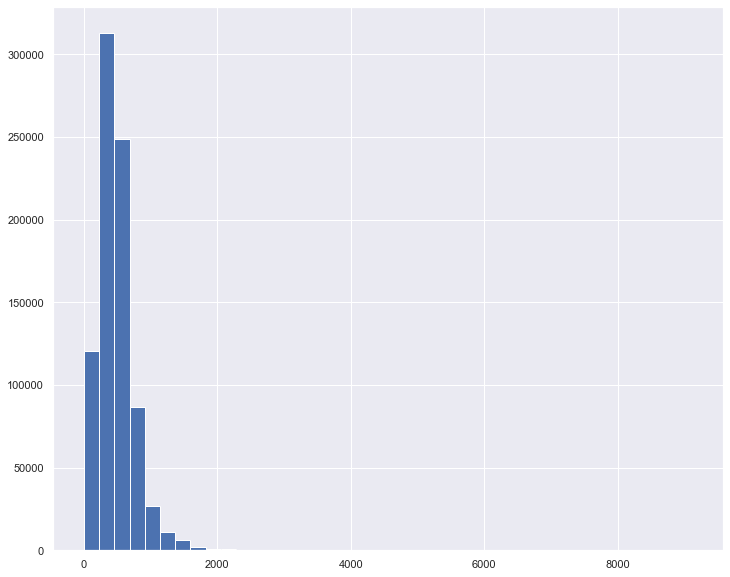

In [91]:
fig = plt.figure(figsize=(12, 10))
plt.hist(distances, bins=40)
plt.show()

In [92]:
print("Mean distance: ", np.mean(distances), "\nMedian distance: ", np.median(distances))

Mean distance:  479.003797865167 
Median distance:  440.5829556232908


As expected, the fires are grouped around centroids, with mean and median less than 500 km

In [93]:
# Create a dataframe of clusters with data from fire_M6:
# lon = centroid longitude
# lat = centroid latitude
# columns for years = total fire radiative power of the cluster for that year

In [94]:
# Change the labels of the centroids by ordering by latitude (ascending)
# This will help the comparisons with fire_V1 centroids that will have very similar clusters
# but different labels

In [95]:
centroids_xy = list(map(lambda x: x.tolist(), centroids))
centroids_xy = reduce(lambda x,y: x+y, centroids_xy)
centroids_xy

[-14.94608339561368,
 22.10878262823079,
 -14.376931939479611,
 -48.93655152548027,
 62.66443814954009,
 128.06417664895656,
 16.578190274631908,
 103.81729167610408,
 52.66853857370098,
 -101.39456590668094,
 45.650499958258,
 23.342964087936554,
 7.463563966876114,
 13.426648247557514,
 -21.105251698670703,
 125.0754580556924,
 52.07802776199231,
 70.08021252716033,
 6.354944171662982,
 -69.21556026506774,
 7.100975544530003,
 31.792647406019526,
 9.238023639219705,
 0.3881649813692576,
 22.44473055205444,
 -102.20304747920318,
 56.8488823553805,
 -119.38852736885765,
 55.392307608019784,
 108.9105989664283,
 -12.23486438785245,
 -63.253967863952,
 25.52549926062847,
 77.21343178457423,
 50.88550464429538,
 53.72026280536927,
 -14.262958061941273,
 34.78216016922092,
 56.32170463736269,
 86.85371248351653,
 16.97010340735411,
 -88.38934899757211,
 -14.654709053795386,
 136.62566218583788,
 10.535195376717393,
 -10.387708543280343,
 41.014841758556564,
 -117.56261036803652,
 -24.09458

In [281]:
temp_df = pd.DataFrame({'latitude': centroids_xy[::2]})
temp_df

,latitude
0,-14.946083
1,-14.376932
2,62.664438
3,16.578190
4,52.668539
5,45.650500
6,7.463564
7,-21.105252
8,52.078028
9,6.354944


In [282]:
temp_df['initial_cluster_id'] = temp_df.index
temp_df

,latitude,initial_cluster_id
0,-14.946083,0
1,-14.376932,1
2,62.664438,2
3,16.578190,3
4,52.668539,4
5,45.650500,5
6,7.463564,6
7,-21.105252,7
8,52.078028,8
9,6.354944,9


In [283]:
temp_df = temp_df.sort_values(by ='latitude', ascending=True)
temp_df

,latitude,initial_cluster_id
35,-32.685674,35
32,-29.213228,32
30,-26.393159,30
24,-24.094589,24
7,-21.105252,7
36,-18.863622,36
0,-14.946083,0
21,-14.654709,21
1,-14.376932,1
18,-14.262958,18


In [284]:
temp_df['ordered_cluster_id'] = range(43)
temp_df

,latitude,initial_cluster_id,ordered_cluster_id
35,-32.685674,35,0
32,-29.213228,32,1
30,-26.393159,30,2
24,-24.094589,24,3
7,-21.105252,7,4
36,-18.863622,36,5
0,-14.946083,0,6
21,-14.654709,21,7
1,-14.376932,1,8
18,-14.262958,18,9


In [106]:
initial_cluster_id = list(temp_df['initial_cluster_id'])
ordered_cluster_id = list(temp_df['ordered_cluster_id'])
clusters_dict = dict(zip(initial_cluster_id, ordered_cluster_id))

In [107]:
clusters_dict

{35: 0,
 32: 1,
 30: 2,
 24: 3,
 7: 4,
 36: 5,
 0: 6,
 21: 7,
 1: 8,
 18: 9,
 15: 10,
 39: 11,
 27: 12,
 38: 13,
 25: 14,
 9: 15,
 33: 16,
 10: 17,
 6: 18,
 11: 19,
 22: 20,
 3: 21,
 20: 22,
 28: 23,
 12: 24,
 16: 25,
 37: 26,
 42: 27,
 26: 28,
 23: 29,
 41: 30,
 5: 31,
 40: 32,
 17: 33,
 29: 34,
 8: 35,
 4: 36,
 14: 37,
 19: 38,
 13: 39,
 2: 40,
 34: 41,
 31: 42}

In [108]:
# now all we need is to change the cluster_id in fire_M6
# by searching the key in clusters_dict and returning the value

In [109]:
fire_M6['cluster_id']

0         32
1         32
2         32
3          7
4          7
          ..
817395    18
817396    18
817397    23
817398    13
817399    30
Name: cluster_id, Length: 817400, dtype: int32

In [110]:
fire_M6.head()

,acq_date,frp,latitude,longitude,decimal_time,mean_brightness,low_confidence,medium_confidence,high_confidence,cluster_id,centroid_lat,centroid_lon,centroid_dist
0,2000-11-01,26.8,-20.8650,146.3039,0.01181,317.00,True,False,False,32,-29.213228,148.623330,957.455259
1,2000-11-01,68.8,-20.5602,146.0194,0.01181,319.95,False,True,False,32,-29.213228,148.623330,997.582913
2,2000-11-01,7.1,-24.3197,151.5619,0.01250,311.15,False,True,False,32,-29.213228,148.623330,617.528306
3,2000-11-01,10.5,-18.0912,128.9856,0.07986,327.20,False,True,False,7,-21.105252,125.075458,529.349351
4,2000-11-01,100.3,-25.5102,125.4199,0.08125,342.75,False,False,True,7,-21.105252,125.075458,491.222470


In [118]:
fire_M6['cluster_id'] = fire_M6['cluster_id'].map(lambda x: clusters_dict[x])

In [120]:
fire_M6.head()

,acq_date,frp,latitude,longitude,decimal_time,mean_brightness,low_confidence,medium_confidence,high_confidence,cluster_id,centroid_lat,centroid_lon,centroid_dist
0,2000-11-01,26.8,-20.8650,146.3039,0.01181,317.00,True,False,False,1,-29.213228,148.623330,957.455259
1,2000-11-01,68.8,-20.5602,146.0194,0.01181,319.95,False,True,False,1,-29.213228,148.623330,997.582913
2,2000-11-01,7.1,-24.3197,151.5619,0.01250,311.15,False,True,False,1,-29.213228,148.623330,617.528306
3,2000-11-01,10.5,-18.0912,128.9856,0.07986,327.20,False,True,False,4,-21.105252,125.075458,529.349351
4,2000-11-01,100.3,-25.5102,125.4199,0.08125,342.75,False,False,True,4,-21.105252,125.075458,491.222470


In [121]:
# creata a wide format dataframe for Fire_M6 with clusters as rows and years as columns
M6_years = []
M6_years = list(set(map(lambda x: x[:4], list(fire_M6['acq_date']))))
M6_years.sort()

In [122]:
print(M6_years)

['2000', '2001', '2002', '2003', '2004', '2005', '2006', '2007', '2008', '2009', '2010', '2011', '2012', '2013', '2014', '2015', '2016', '2017', '2018', '2019']


In [123]:
n_clusters = 43
M6_clusters_df = pd.DataFrame({'cluster_id': range(n_clusters),
                               'lon': np.nan*n_clusters,
                               'lat': np.nan*n_clusters})
for i in range(len(M6_years)):
    M6_clusters_df[M6_years[i]] = np.nan

In [124]:
M6_clusters_df

,cluster_id,lon,lat,2000,2001,2002,2003,2004,2005,2006,...,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [184]:
lat = []
lon = []
for i in range(43):
    lat.append(list(fire_M6.loc[fire_M6['cluster_id']==i].centroid_lat[:1].values))
    lon.append(list(fire_M6.loc[fire_M6['cluster_id']==i].centroid_lon[:1].values))
lat=reduce(lambda x,y: x+y, lat)
lon=reduce(lambda x,y: x+y, lon)

In [187]:
M6_clusters_df['lat'] = lat
M6_clusters_df['lon'] = lon

In [188]:
M6_clusters_df

,cluster_id,lon,lat,2000,2001,2002,2003,2004,2005,2006,...,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
0,0,-64.674060,-32.685674,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,148.623330,-29.213228,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,29.118374,-26.393159,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,-57.832112,-24.094589,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,125.075458,-21.105252,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,5,46.437379,-18.863622,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,6,22.108783,-14.946083,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,7,136.625662,-14.654709,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,8,-48.936552,-14.376932,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,9,34.782160,-14.262958,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# In M6_clusters_df the clusters are ordered by latitude (ascending)

In [279]:
fire_M6['acq_year'] = list(map(lambda x: str(toYearFraction(x, decimals=False)), fire_M6['acq_date']))
for year in M6_years:
    yearly_frp = [0] * n_clusters
    for k in M6_clusters_df['cluster_id']:
        yearly_frp[k] = fire_M6[fire_M6['acq_year']==year].loc[fire_M6['cluster_id']==k]['frp'].sum()
    M6_clusters_df[year] = yearly_frp

In [280]:
M6_clusters_df

,cluster_id,lon,lat,2000,2001,2002,2003,2004,2005,2006,...,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
0,0,-64.674060,-32.685674,3992.0,23577.7,22888.3,44046.5,23221.6,18168.1,18766.3,...,11204.5,20896.4,9340.2,12645.3,9256.4,14049.9,25865.4,46547.7,17639.2,13034.0
1,1,148.623330,-29.213228,914.3,20260.2,30431.7,53455.2,30474.2,26769.4,47276.3,...,10827.2,43358.6,44097.0,26958.0,24410.2,14020.0,16037.4,18379.2,25709.5,19627.8
2,2,29.118374,-26.393159,667.7,19355.6,36017.4,28204.6,23428.7,34934.6,27422.8,...,63899.5,54954.4,32070.1,25482.3,33752.1,25920.6,18345.3,30732.9,34487.2,18994.1
3,3,-57.832112,-24.094589,946.7,16319.3,73121.6,75492.3,57834.7,67487.8,56194.6,...,67784.4,51487.0,50040.6,50843.9,32251.7,33373.9,42828.1,55716.9,29842.5,56397.7
4,4,125.075458,-21.105252,18230.5,74971.8,171767.3,47942.3,84620.6,40632.3,96964.3,...,27378.2,138145.5,178380.0,45476.7,65275.8,76005.1,33358.4,121038.1,129968.7,48481.5
5,5,46.437379,-18.863622,487.1,7065.3,10533.4,18404.4,12175.5,21529.2,19236.6,...,18621.1,19541.3,17319.6,23712.3,16216.7,16822.4,19986.1,17761.7,16728.7,8237.4
6,6,22.108783,-14.946083,1126.8,27909.2,69392.9,103874.1,111684.7,111064.0,90129.3,...,117688.4,179325.2,147806.4,122900.9,103850.7,115103.4,110421.4,98857.5,92060.5,105009.0
7,7,136.625662,-14.654709,2178.2,67037.8,76723.0,43315.4,102718.6,41990.8,68228.5,...,28823.8,162195.2,113735.5,32952.0,71863.3,69912.2,32267.7,59033.3,68301.5,31033.7
8,8,-48.936552,-14.376932,452.2,21496.6,92540.9,93182.2,120999.6,90389.7,68389.9,...,145607.1,60008.2,73495.5,33851.8,62572.1,64601.2,44294.3,68383.2,26957.8,54646.2
9,9,34.782160,-14.262958,266.8,23023.4,57670.6,86006.2,65367.8,97032.8,73715.2,...,100000.1,81041.6,81762.7,88964.9,80032.2,83801.1,82648.5,71796.2,76477.0,57259.9


In [ ]:
# Apply the same procedure to the V1 dataset

In [286]:
kmeans = KMeans(n_clusters=43, random_state=43).fit(X_V1)
fire_V1['cluster_id'] = np.nan
fire_V1['centroid_lat'] = np.nan
fire_V1['centroid_lon'] = np.nan
fire_V1['centroid_dist'] = np.nan # distance to centroid center [km]

In [287]:
# Fill cluster_id, centroid_lat, centroid_lon in the dataframe
fire_V1['cluster_id']=kmeans.labels_
centroids = kmeans.cluster_centers_
centroids_xy = centroids.flatten().tolist()
fire_V1['centroid_lat'] = list(map(lambda x: centroids_xy[2*x], fire_V1['cluster_id']))
fire_V1['centroid_lon'] = list(map(lambda x: centroids_xy[1+2*x], fire_V1['cluster_id']))

In [288]:
distances = []
for i in range(len(fire_V1)):
    distances.append(calculateDistance(radians(fire_V1['latitude'][i]), radians(fire_V1['longitude'][i]),
                                       radians(fire_V1['centroid_lat'][i]), radians(fire_V1['centroid_lon'][i])))
fire_V1['centroid_dist'] = distances

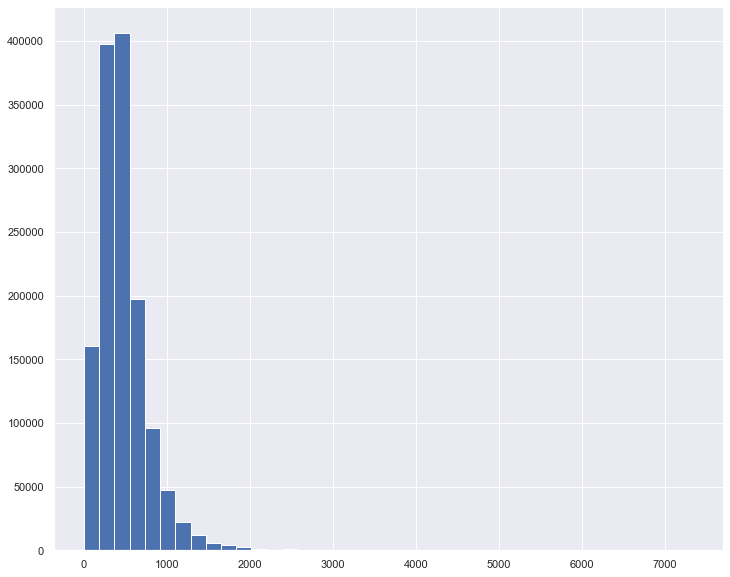

In [289]:
fig = plt.figure(figsize=(12, 10))
plt.hist(distances, bins=40)
plt.show()

In [290]:
print("Mean distance: ", np.mean(distances), "\nMedian distance: ", np.median(distances))

Mean distance:  468.5971871554624 
Median distance:  414.3951084143064


In [291]:
# The histogram, mean and median for fire_V1 are very similar with the ones for fire_V6

In [292]:
# Create a dataframe of clusters with data from fire_V1:
# lon = centroid longitude
# lat = centroid latitude
# columns for years = total fire radiative power of the cluster for that year
# Change the labels of the centroids by ordering by latitude (ascending)

In [293]:
centroids_xy = list(map(lambda x: x.tolist(), centroids))
centroids_xy = reduce(lambda x,y: x+y, centroids_xy)

In [294]:
temp_df = pd.DataFrame({'latitude': centroids_xy[::2]})
temp_df['initial_cluster_id'] = temp_df.index

In [295]:
temp_df = temp_df.sort_values(by ='latitude', ascending=True)
temp_df['ordered_cluster_id'] = range(43)

In [296]:
initial_cluster_id = list(temp_df['initial_cluster_id'])
ordered_cluster_id = list(temp_df['ordered_cluster_id'])
clusters_dict = dict(zip(initial_cluster_id, ordered_cluster_id))

In [298]:
fire_V1['cluster_id'] = fire_V1['cluster_id'].map(lambda x: clusters_dict[x])

In [299]:
fire_V1.head()

,acq_date,frp,latitude,longitude,decimal_time,mean_brightness,low_confidence,medium_confidence,high_confidence,cluster_id,centroid_lat,centroid_lon,centroid_dist
0,2012-01-31,0.9,11.81456,4.97983,0.05208,298.45,False,True,False,20,8.351486,9.434734,621.535282
1,2012-01-31,1.3,10.39675,13.45527,0.05208,302.25,False,True,False,20,8.351486,9.434734,496.401502
2,2012-01-31,1.9,13.73985,13.83765,0.05208,301.80,False,True,False,20,8.351486,9.434734,768.153443
3,2012-01-31,1.1,10.61242,13.48132,0.05208,298.25,False,True,False,20,8.351486,9.434734,510.202829
4,2012-01-31,1.8,9.41623,-2.80546,0.05278,299.55,False,True,False,21,9.229927,-0.593414,243.677644


In [300]:
# creata a wide format dataframe for fire_V1 with clusters as rows and years as columns
V1_years = []
V1_years = list(set(map(lambda x: x[:4], list(fire_M6['acq_date']))))
V1_years.sort()
n_clusters = 43
V1_clusters_df = pd.DataFrame({'cluster_id': range(n_clusters),
                               'lon': np.nan*n_clusters,
                               'lat': np.nan*n_clusters})
for i in range(len(V1_years)):
    V1_clusters_df[V1_years[i]] = np.nan

In [302]:
lat = []
lon = []
for i in range(43):
    lat.append(list(fire_V1.loc[fire_V1['cluster_id']==i].centroid_lat[:1].values))
    lon.append(list(fire_V1.loc[fire_V1['cluster_id']==i].centroid_lon[:1].values))
lat=reduce(lambda x,y: x+y, lat)
lon=reduce(lambda x,y: x+y, lon)

In [303]:
V1_clusters_df['lat'] = lat
V1_clusters_df['lon'] = lon

In [304]:
fire_V1['acq_year'] = list(map(lambda x: str(toYearFraction(x, decimals=False)), fire_V1['acq_date']))
for year in V1_years:
    yearly_frp = [0] * n_clusters
    for k in V1_clusters_df['cluster_id']:
        yearly_frp[k] = fire_V1[fire_V1['acq_year']==year].loc[fire_V1['cluster_id']==k]['frp'].sum()
    V1_clusters_df[year] = yearly_frp

In [306]:
V1_clusters_df

,cluster_id,lon,lat,2000,2001,2002,2003,2004,2005,2006,...,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
0,0,149.014861,-29.087170,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,34821.4,31104.1,25656.2,16319.5,16728.1,19789.7,23860.7,12267.4
1,1,-60.209660,-26.923811,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,51249.6,58829.3,33667.4,35077.2,47196.1,68333.5,38367.0,8572.5
2,2,29.778094,-25.776436,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,30939.7,28031.7,37600.3,27694.0,18438.2,31838.2,33085.8,3935.6
3,3,122.965117,-25.248346,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,100816.7,19076.9,32047.4,29614.4,10867.3,50974.9,66708.4,44015.0
4,4,46.429239,-19.058311,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,26527.0,33115.8,28566.9,30359.9,34332.8,28902.1,29048.7,2527.9
5,5,130.485857,-15.250501,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,80474.9,37051.9,68463.7,67902.6,34511.8,64926.4,63447.6,11736.4
6,6,-48.724295,-14.532171,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,71514.8,29836.8,50569.8,59504.4,46804.7,57850.2,27302.1,5139.2
7,7,18.568459,-14.287394,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,119462.5,106624.9,92034.6,102541.6,98541.3,98963.7,95778.8,22083.7
8,8,142.179537,-14.283010,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,37580.9,18387.2,22908.2,30593.3,17508.6,18802.3,26930.9,2264.0
9,9,35.946453,-13.981528,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,102911.0,101622.1,96380.4,105315.0,104248.5,91753.6,92638.5,3599.6


In [307]:
# as shown above, in V1 dataset the first entries are from 2012 so there is no data between 2000 and 2012